In [1]:
%pip install -Uq diffusers transformers fastcore

Note: you may need to restart the kernel to use updated packages.


In [1]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

In [2]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",
                                               variant="fp16", torch_dtype=torch.float16).to("cuda")

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [3]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4
models--google--gemma-7b-it
models--openai--clip-vit-large-patch14
models--runwayml--stable-diffusion-v1-5
models--sentence-transformers--all-mpnet-base-v2
version_diffusers_cache.txt
version.txt


In [4]:
prompt = "a photograph of an astronaut riding a horse"

  0%|          | 0/50 [00:00<?, ?it/s]

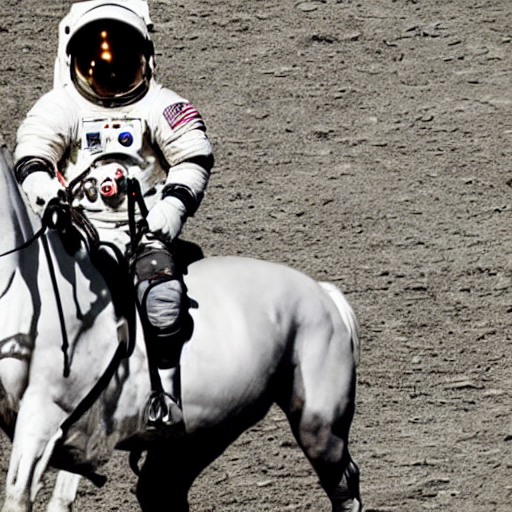

In [12]:
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

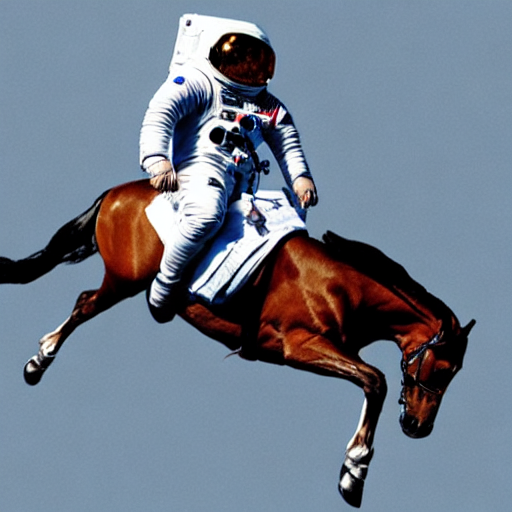

In [13]:
torch.manual_seed(seed=1024)
pipe(prompt).images[0]

  0%|          | 0/3 [00:00<?, ?it/s]

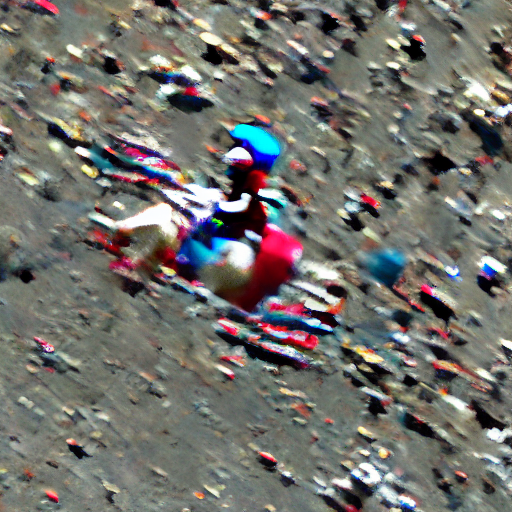

In [26]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

### Classifier-Free Guidance

In [27]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [28]:
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols

In [29]:
prompts

['a photograph of an astronaut riding a horse',
 'a photograph of an astronaut riding a horse',
 'a photograph of an astronaut riding a horse',
 'a photograph of an astronaut riding a horse']

In [30]:
images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

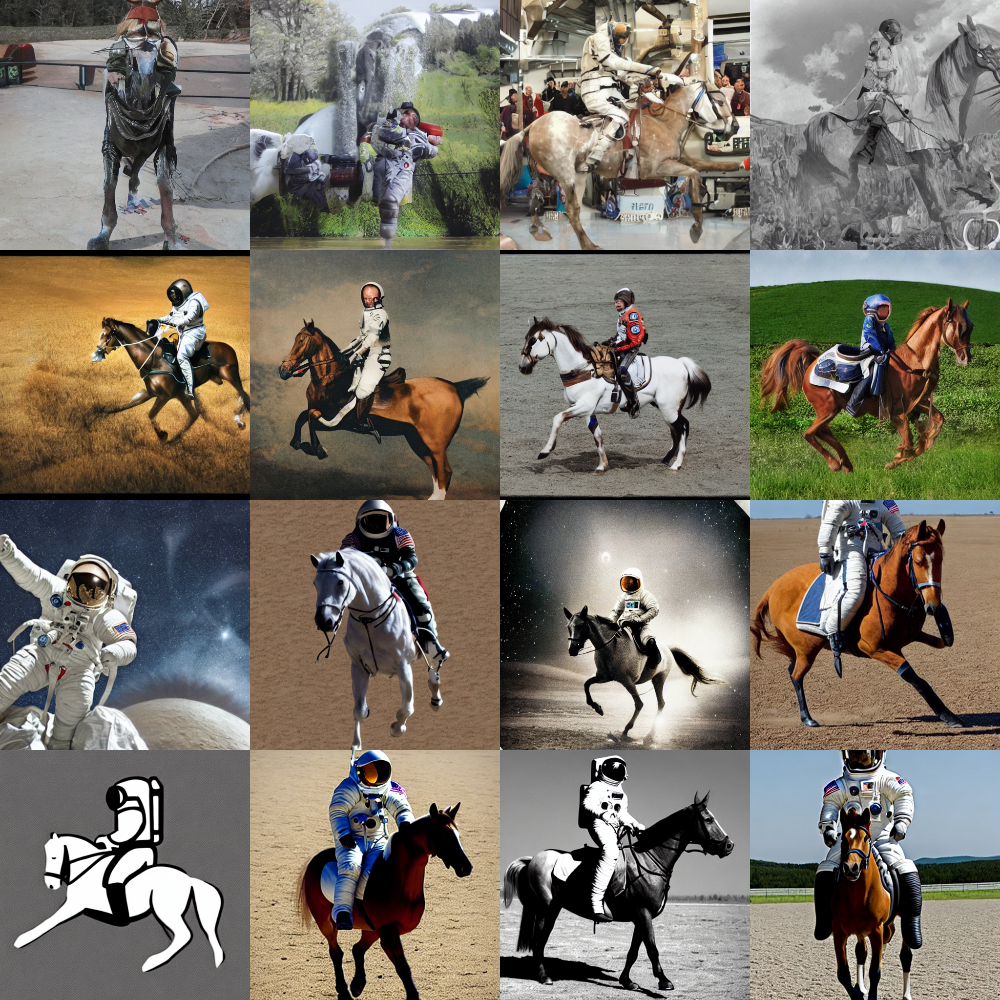

In [31]:
image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

  0%|          | 0/50 [00:00<?, ?it/s]

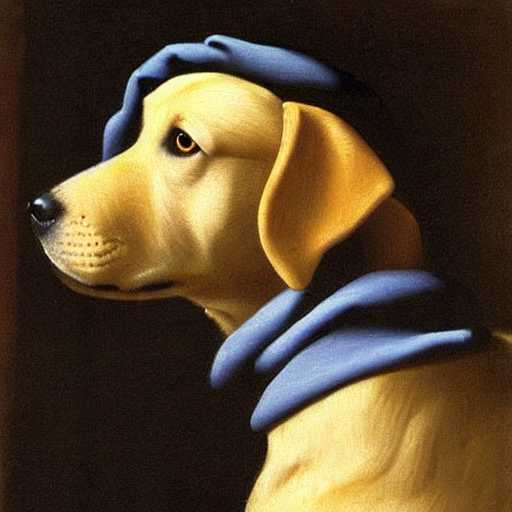

In [32]:
torch.manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

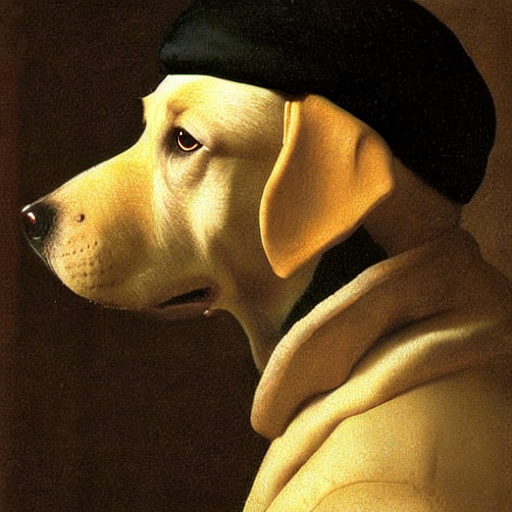

In [33]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="blue").images[0]


### Image to Image

In [36]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

ModuleNotFoundError: No module named 'fastdownload'